# Public transit data

I have found data on public transit in Denmark in a few places.
the folder "improved-gtfs-rejseplanen-dk" and "rejseplanen-dk-geojson" is from [busmaps.com](https://busmaps.com/en/country/Rejseplanen/rejseplanen-dk).

It originates from [labs.rejseplanen.dk](https://labs.rejseplanen.dk/hc/en-us/articles/24750139021341-Oversigt-over-udstillede-data), but is also hosted on [eu.data.public-transport.earth](https://eu.data.public-transport.earth/#gtfs-feeds).

The CRS is WGS84 ([according to rejseplanen](https://labs.rejseplanen.dk/hc/en-us/articles/21639781805853-Om-stoppestedsdata))





## Preamble

In [1]:
import os
os.environ['PROJ_LIB'] = '/opt/conda/share/proj'

import geopandas as gpd
import pandas as pd
import numpy as np
import osmnx
import contextily as cx
import matplotlib.pyplot as plt
import os
import libpysal as ps
import pointpats

from pointpats import distance_statistics, PoissonPointProcess, Window, PointPattern
from pointpats.distance_statistics import K, F, G, L
from shapely.geometry import Polygon, Point
from shapely.prepared import prep
from os.path import join
from libpysal.cg import shapely_ext

In [2]:
dir_data = "data"
dir_pt = "public_transit"
dir_gtfs = "improved-gtfs-rejseplanen-dk"
dir_clean = "cleaned"

fp_indbyggertal= "indbyggertal.csv"

## Loading and filtering

In [3]:
stops = pd.read_csv(join(dir_data, dir_pt, dir_gtfs, "stops.txt"))
stops[~stops['platform_code'].isna()]
stops = stops.dropna(axis=1, how='all')

In [4]:
stops[stops['stop_name'] == 'København H']

,stop_id,stop_code,stop_name,stop_lat,stop_lon,location_type,stop_timezone,wheelchair_boarding
208,102785-000008600626,NaN,København H,55.673059,12.565558,0,Europe/Copenhagen,0


In [5]:
stops = gpd.GeoDataFrame(stops, geometry=gpd.points_from_xy(stops.stop_lon, stops.stop_lat), crs="EPSG:4326")

Are there more columns that contain no useful data?

In [6]:
stops[~stops['stop_code'].isna()]

,stop_id,stop_code,stop_name,stop_lat,stop_lon,location_type,stop_timezone,wheelchair_boarding,geometry
33,102785-000008600505,GD,Gelsted St.,55.396061,9.974252,0,Europe/Copenhagen,0,POINT (9.97425 55.39606)
34434,102785-000008600295,GP,Gødstrup St.,56.158666,8.893306,0,Europe/Copenhagen,0,POINT (8.89331 56.15867)
35029,102785-000008600713,VNG,Vinge St.,55.810333,12.115244,0,Europe/Copenhagen,0,POINT (12.11524 55.81033)


In [7]:
stops[stops['location_type'] != 0]

,stop_id,stop_code,stop_name,stop_lat,stop_lon,location_type,stop_timezone,wheelchair_boarding,geometry


In [8]:
stops[stops['wheelchair_boarding'] != 0]

,stop_id,stop_code,stop_name,stop_lat,stop_lon,location_type,stop_timezone,wheelchair_boarding,geometry


In [9]:
stops['stop_timezone'].unique()

array(['Europe/Copenhagen', 'Europe/Stockholm', 'Europe/Berlin'],
      dtype=object)

Copenhagen, Stockhold and Berlin are on the same time zone so for our purposes we do not need this column (I don't know if this has a meaning when considering summer / winter time, but we are not working with actual historical or real time trips, so it won't be an issue).

In [10]:
stops = stops.drop(columns=['location_type', 'stop_code', 'stop_timezone', 'wheelchair_boarding', 'stop_lat', 'stop_lon'])

stops.columns

Index(['stop_id', 'stop_name', 'geometry'], dtype='object')

Finally, let us project the data into the same crs as the settlements data (epsg 25832)

In [11]:
stops = stops.to_crs(epsg=25832)

### Saving to file

In [12]:
stops.to_file(join(dir_data, "cleaned", "stops.gpkg"), driver="GPKG")

/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


## Exploring

There are so many points that it is hard to say anything about this data at first glance.

Let us investigate if they are clustered.

In [13]:
points = np.array([[geom.x, geom.y] for geom in stops.geometry])
points

array([[ 585275.94245132, 6135110.91114467],
       [ 672250.01994511, 6172400.0006419 ],
       [ 670143.9763012 , 6177768.01515134],
       ...,
       [ 564551.97799513, 6296227.99269829],
       [ 562513.99556643, 6309453.9519442 ],
       [ 705291.98070842, 6203399.97777575]])

In [14]:
len(points)

36981

### Ripley's G

In [15]:
g_test = distance_statistics.g_test(
    points, support=10000, keep_simulations=True, n_simulations=50
)

In [16]:
len(g_test.simulations.T)
len(g_test.support)

10000

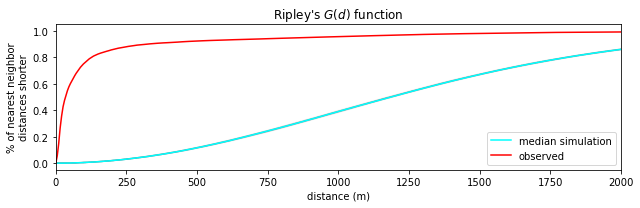

In [17]:
f,ax = plt.subplots(1,figsize=(9,3))
# plot all the simulations with very fine lines
ax.plot(g_test.support, g_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax.plot(g_test.support, np.median(g_test.simulations, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's G function
ax.plot(g_test.support, g_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax.set_xlabel('distance (m)')
ax.set_ylabel('% of nearest neighbor\ndistances shorter')
ax.legend()
ax.set_xlim(0,2000)
ax.set_title(r"Ripley's $G(d)$ function")
f.tight_layout()
plt.show()

There is very clear clustering.
However, this should be obvious, as the data by necessity must be clustered inside the landmasses.
As Denmark is composed of many islands (and a peninsula).

We will try to solve this by masking with a shape file.

### Improving uniform simulations with mask

In [18]:
dk_file = gpd.read_file(join(dir_data, dir_clean, "municipalities.gpkg"))

In [19]:
dk = dk_file.unary_union

I had to work long to fix this.
The environment I am using is using an old version of pointpats, and so there are some functionalities lacking, and the online guidance was sometimes for a different version.

After realizing that the pointpats.PoissonPointProcess was way too slow to get to work in practice. I consulted chatbots specifically to create the function below to generate random points within a polygon.
I especially had to get help to make it fast enough for practical use.

The theory is to generate uniformly random points, rejecting the ones outside of the mask polygon (Denmark), until you have $n$ points.
Then, we save some number of simulations, and use them for the Ripleys alphabet tests.

In [20]:
def generate_points_in_polygon(polygon, n):
    i = 0
    minx, miny, maxx, maxy = polygon.bounds
    points = np.zeros((n, 2))
    prep_poly = prep(polygon)  # speeds up repeated `.contains()` calls

    while i < n:
        # Sample uniformly in bounding box
        random_points = np.column_stack([
            np.random.uniform(minx, maxx, n),
            np.random.uniform(miny, maxy, n)
        ])

        # Filter points inside the polygon
        for x, y in random_points:
            pt = Point(x, y)
            if prep_poly.contains(pt):
                points[i] = ([x, y])
                i += 1
            if i == n:
                break

    return points

In [21]:
%%time
# Slow cell
simulation_points = [generate_points_in_polygon(dk, len(points)) for _ in range(40)]

CPU times: user 51.8 s, sys: 6.46 ms, total: 51.8 s
Wall time: 51.8 s


Let's see if the data looks correct

In [22]:
test = simulation_points[0]
s = gpd.GeoSeries(map(Point, test))
gpd.GeoDataFrame(test, geometry=s, columns=['A', 'B'], crs=stops.crs).explore()

It does, from initial inspection.

In [23]:
real = PointPattern(points)
simulations = [PointPattern(sim) for sim in simulation_points]
type(real)

pointpats.pointpattern.PointPattern

In [24]:
g_real = G(real, intervals=100, dmax=3000)

In [25]:
%%time
# Slow cell
g_sims = [G(sim, intervals=100, dmax=3000) for sim in simulations]

CPU times: user 1min 12s, sys: 492 µs, total: 1min 12s
Wall time: 1min 12s


In [26]:
sim_g = np.array([g.G for g in g_sims])
d = g_real.d

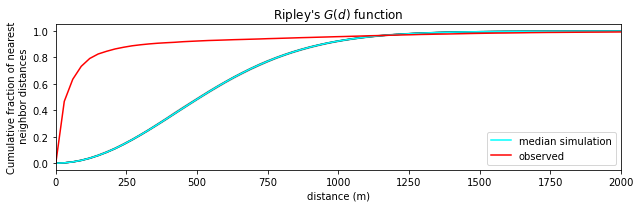

In [27]:
f,ax = plt.subplots(1,figsize=(9,3))
# plot all the simulations with very fine lines
ax.plot(d, sim_g.T, color='k', alpha=.05)
# and show the average of simulations
ax.plot(d, np.median(sim_g, axis=0), color='cyan', 
         label='median simulation')


# and the observed pattern's G function
ax.plot(g_real.d, g_real.G, label = 'observed', color='red')

# clean up labels and axes
ax.set_xlabel('distance (m)')
ax.set_ylabel('Cumulative fraction of nearest\n neighbor distances')
ax.legend()
ax.set_xlim(0,2000)
ax.set_title(r"Ripley's $G(d)$ function")
f.tight_layout()
plt.show()


It seems indeed that we have clustering!
Let us try the rest of the alphabet.
This only shows that the distance to the nearest neighbor is closer than random. And we can't see if clustering occurs at different scales.
For that, we need the normalised Ripley's L.

### Ripley's L and beyond

This work never got finished. I tried to manually calculate and fix Ripley's K and L according to the mask.
In all my attempts, I saw clustering, but I think I ran in to artifacts, because the mask was too complicated.
Because my version of pointpats did not support this, I tried to do it manually - but failed.
In any case, everything points to the stops being clustered at every scale.

Further, whenever I try calling distance_statistics.k_test or distance_statistics.l_test, my IPython kernel crashes. 
I haven't been able to figure out why.
Therefor, I have to give up on this inquiry.

In [28]:
k_real = K(real, intervals=50, dmax=1000)

In [29]:
# This cell is slow
k_sims = [K(sim, intervals=50, dmax=1000) for sim in simulations]

In [30]:
sim_k = np.array([k.k for k in k_sims])
kd = k_real.d

# Need to correct for the area of the mask
Aused = real.mbb_area
Areal = dk.area
n = len(points)

# correct = lambda val: (val / Areal) * Aused
correct = lambda val:  val * (Areal / Aused)
k_real_corrected = correct(k_real.k)

k_sims_corrected = np.array([correct(sim.k) for sim in k_sims])

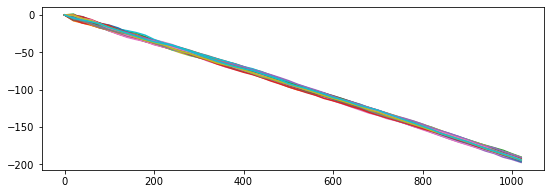

array([   0.        ,  345.73418271,  425.2611191 ,  453.72643715,
        472.80085329,  486.68202792,  498.3379183 ,  505.61559184,
        512.5619325 ,  523.55930673,  538.57261584,  558.07747345,
        578.87202464,  602.80816505,  630.3999898 ,  656.11739691,
        683.36890894,  709.39130223,  735.71258417,  761.24302033,
        785.16071429,  809.60474033,  833.81996631,  857.35019631,
        879.35461142,  903.03132669,  923.78613753,  945.50795323,
        966.10269564,  987.62207088, 1008.69294604, 1029.00849608,
       1048.2251054 , 1067.74659604, 1087.61488962, 1107.10835518,
       1127.36900359, 1146.54231883, 1165.56933234, 1183.40237388,
       1202.17267476, 1221.2328138 , 1239.2075612 , 1257.17339409,
       1275.17728882, 1293.43203744, 1310.81979011, 1328.82842448,
       1345.96734004, 1362.76994019, 1380.28366943, 1397.07844521])

In [31]:
l_corrected = np.sqrt(k_real_corrected / np.pi) - k_real.d
l_sims_corrected = np.sqrt(k_sims_corrected / np.pi) - k_real.d

l_sims_corrected
f,ax = plt.subplots(1,figsize=(9,3))

ax.plot(kd, l_sims_corrected.T)
plt.show()
l_corrected